# JuliaAstro Package Tutorials 1

## JWST image with scale bar

- **(JuliaAstro tutorial)** http://juliaastro.org/dev/tutorials/jwst-image-scale-bar/
- **(AstroImages youtube)** https://www.youtube.com/watch?v=tpFNIV2jyb8
- **(AstroImages.jl Doc)** http://juliaastro.org/AstroImages.jl/dev/
- **(MAST)** https://mast.stsci.edu/portal/Mashup/Clients/Mast/Portal.html
- **(MAST data download)** https://www.youtube.com/watch?v=evqXcRR0k5w
- **(Jansky unit)** https://en.wikipedia.org/wiki/Jansky
- **(WCS, world coordinate system)** https://docs.astropy.org/en/stable/wcs/index.html
- **(JWST-docs)** https://jwst-docs.stsci.edu/getting-started-with-jwst-data
- **(blog, JWST data download process)** https://telescope.live/blog/how-download-publicly-released-jwst-data-process

### 1. Environment check

In [1]:
versioninfo()

Julia Version 1.8.0
Commit 5544a0fab7 (2022-08-17 13:38 UTC)
Platform Info:
  OS: Windows (x86_64-w64-mingw32)
  CPU: 16 × 12th Gen Intel(R) Core(TM) i7-1260P
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-13.0.1 (ORCJIT, goldmont)
  Threads: 1 on 16 virtual cores


In [2]:
pwd()

"E:\\JuliaAstro"

In [3]:
using Downloads

In [4]:
# URL changed -> 재확인 필요

# fname = Downloads.download(
#    "https://stpubdata-jwst.stsci.edu/ero/jw02731/L3/t/"*
#    "jw02731-o001_t017_nircam_clear-f187n_i2d.fits"
# )

# Download가 안될 경우 로컬로 파일 다운로드 후 불러오기 

# local_path_carina = ("E:\JuliaAstro\MAST_2023-01-17T0202\JWST\jw02731-o001_t017_nircam_clear-f187n/" *
#                      "jw02731-o001_t017_nircam_clear-f187n_i2d.fits")

LoadError: syntax: invalid escape sequence

In [5]:
# https://mast.stsci.edu/portal/Mashup/Clients/Mast/Portal.html 에서 다운받은 fits 파일의 로컬 경로를 지정
# 참고영상: https://www.youtube.com/watch?v=evqXcRR0k5w

local_path_carina = ("E:/JuliaAstro/" *
"MAST_2023-01-17T0202/JWST/jw02731-o001_t017_nircam_clear-f187n/" *
"jw02731-o001_t017_nircam_clear-f187n_i2d.fits")

"E:/JuliaAstro/MAST_2023-01-17T0202/JWST/jw02731-o001_t017_nircam_clear-f187n/jw02731-o001_t017_nircam_clear-f187n_i2d.fits"

In [6]:
using AstroImages

In [7]:
carina_full = load(local_path_carina); # semi-colon prevents displaying the image

┌ Info: Image was loaded from HDU 2
└ @ AstroImages C:\Users\jeffr\.julia\packages\AstroImages\EY1Gr\src\io.jl:131


In [8]:
size(carina_full)

(14496, 8678)

Wow, that's over 120 megapixels!

AstroImages will fall back to downscaling it automatically before displaying it using `ImageTransformations.restrict`, 

but let's make our lives simpler and just use every 10th pixel:

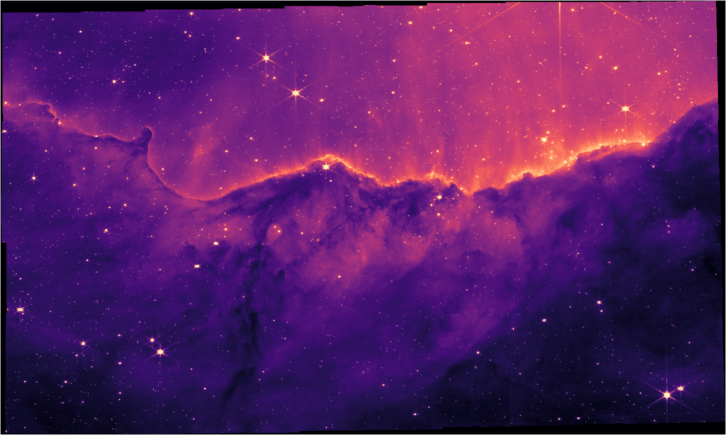

In [9]:
carina = carina_full[begin:10:end, begin:10:end]

**`imview`** is the function that was called automatically to display the image, but we can call it ourselves if we want to customize the display. We can make the image pop a little more by adjusting the display limits, or clims. These can be either a tuple of min and max values (i.e. (0.0, 100.0)) or a function to calculate them for us based on some criteria. We'll adjust the limits to remove the top and bottom 1% of all pixels:

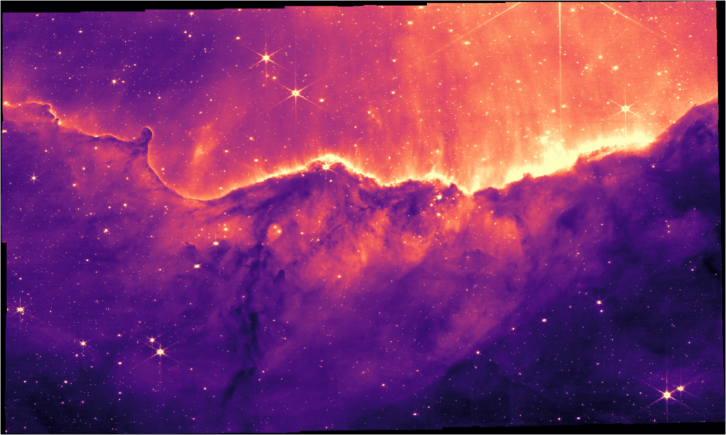

In [10]:
imview(carina; clims = Percent(98))

In Julia, **`keyword arguments`** come after positional arguments and they can be separated by a semi-colon.

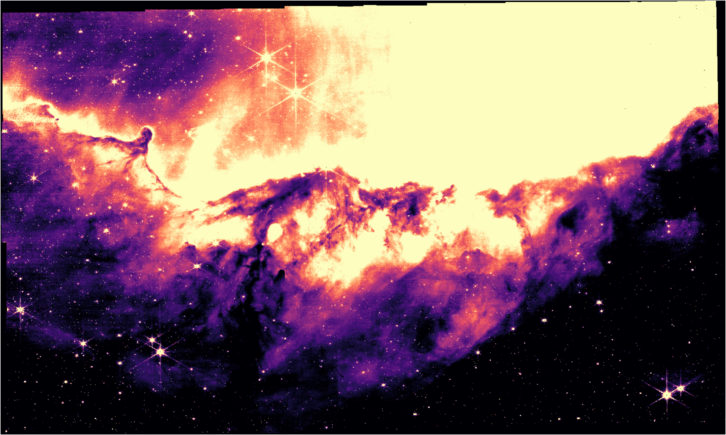

In [11]:
imview(carina; clims = Percent(50))

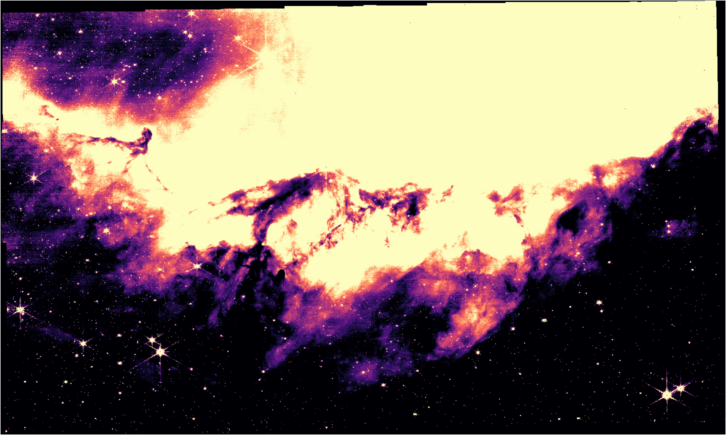

In [12]:
imview(carina; clims = Percent(30))

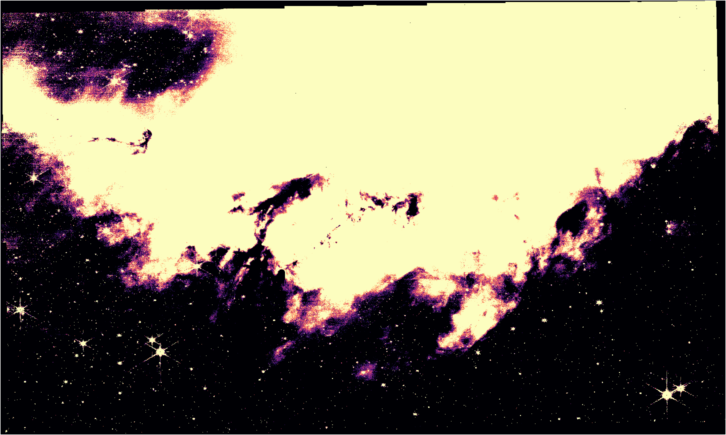

In [13]:
imview(carina; clims = Percent(10))

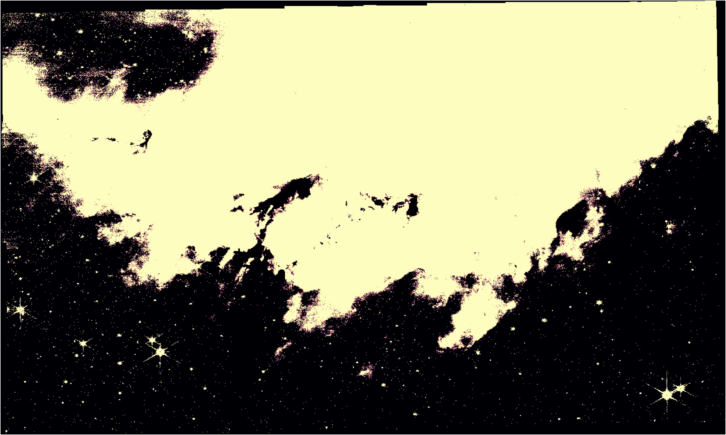

In [14]:
imview(carina; clims = Percent(2))

## Adding World Corrdinates

The image header already contains WCS keys to specify the location of the image in the sky. Let's take a peek at one of these header keys:

In [15]:
println(carina["CTYPE1", Comment])

Axis 1 type


In [16]:
println(carina["CTYPE1"])

RA---TAN


In [17]:
println(carina["CTYPE2", Comment])

Axis 2 type


In [18]:
println(carina["CTYPE2"])

DEC--TAN


In [19]:
typeof(carina.data)

Matrix{Float32} (alias for Array{Float32, 2})

In [20]:
carina.data[1:10, 1:10]

10×10 Matrix{Float32}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0

In [21]:
carina.dims

X Sampled{Int64} 1:10:14491 ForwardOrdered Regular Points,
Y Sampled{Int64} 1:10:8671 ForwardOrdered Regular Points

In [22]:
ndims(carina)

2

In [23]:
size(carina)

(1450, 868)

In [24]:
carina.header

XTENSION= 'IMAGE   '           / Image extension
BITPIX  =                  -32 / array data type
NAXIS   =                    2 / number of array dimensions
NAXIS1  =                14496
NAXIS2  =                 8678
PCOUNT  =                    0 / number of parameters
GCOUNT  =                    1 / number of groups
EXTNAME = 'SCI     '           / extension name
MJD-BEG =    59733.37547690324 / [d] exposure start time in MJD
MJD-AVG =    59733.48862276123 / [d] exposure mid-point in MJD
MJD-END =    59733.60158137731 / [d] exposure end time in MJD
TDB-BEG =    59733.38083258919 / [d] TDB time of exposure start in MJD
TDB-MID =    59733.49397718385 / [d] TDB time of exposure mid-point in MJD
TDB-END =    59733.60693452983 / [d] TDB time of exposure end in MJD
XPOSURE =             46382.88 / [s] Effective exposure time
TELAPSE =             46382.88 / [s] Total elapsed exposure time
                              
                               / JWST ephemeris information
       

In [25]:
carina.refdims

()

In [26]:
carina.wcs

1-element Vector{WCS.WCSTransform}:
 WCSTransform(naxis=2,cdelt=[1.0, 1.0],crval=[0.0, 0.0],crpix=[0.0, 0.0])

In [27]:
carina.wcs_stale

Base.RefValue{Bool}(true)

In [28]:
carina.wcsdims

X Sampled{Int64} Base.OneTo(14496) ForwardOrdered Regular Points,
Y Sampled{Int64} Base.OneTo(8678) ForwardOrdered Regular Points

## implot 함수

```julia 
imview(img; clims = Percent(99.5), stretch = identity, cmap=:magma, contrarst=1.0, bias=0.5)
```

In [29]:
using Plots

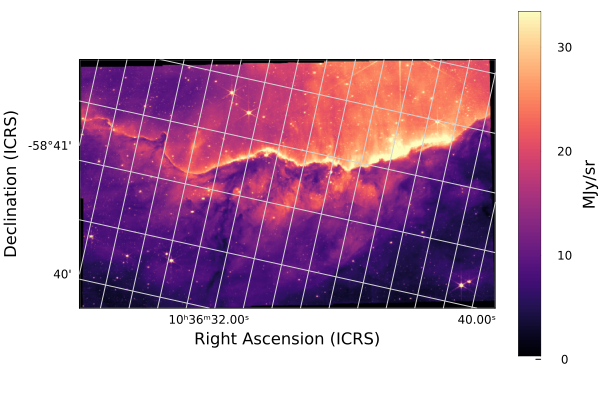

In [30]:
implot(carina; clims = Percent(98))

The image is titled compared to the right-ascension and declination celectial coordinate system, so the grid is rotated.

The colourbar on the right displays the units of the image: Mega-Jenskys per steradian: units of energy per collecting area, per spectral bandwidth, per solid-angle on the sky.


- Jansky(얀스키) 단위
- 스펙트럼 플럭스 밀도 또는 스펙트럼 조사 강도의 비 
     - $ S = \iint_{source}^{} B(\theta, \phi)d\Omega $
     - $ 1 Jy = 10^{-26} \ W \cdot m^{-2} \cdot Hz^{-1} $ watts per square metre per hertz


Let's turn off the grid for now:

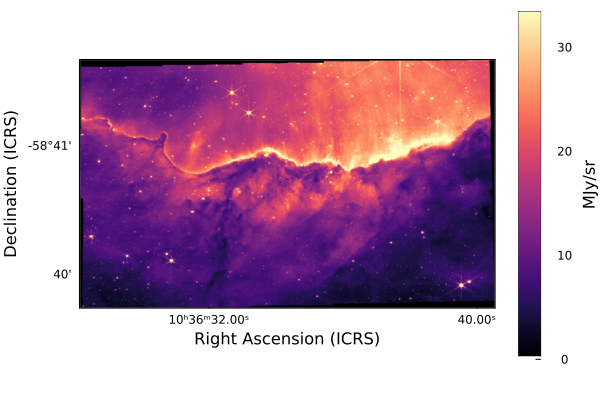

In [31]:
implot(carina; grid = false, clims = Percent(98))

- **소소한 컬러맵 변환** 

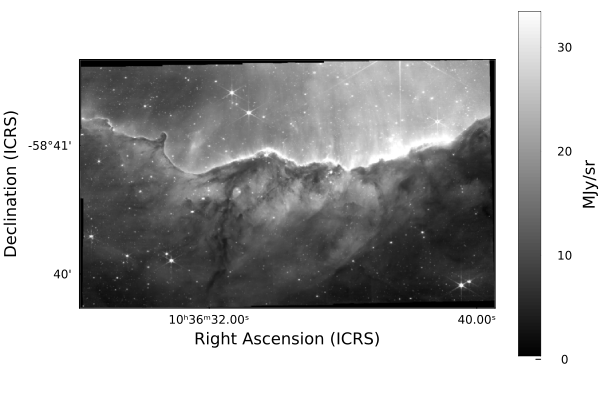

In [32]:
implot(carina; grid = false, clims = Percent(98), cmap = nothing)

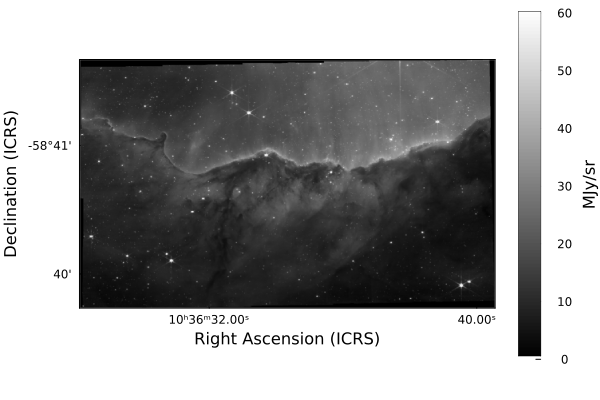

In [33]:
implot(carina; grid = false, clims = Zscale() , cmap = nothing)

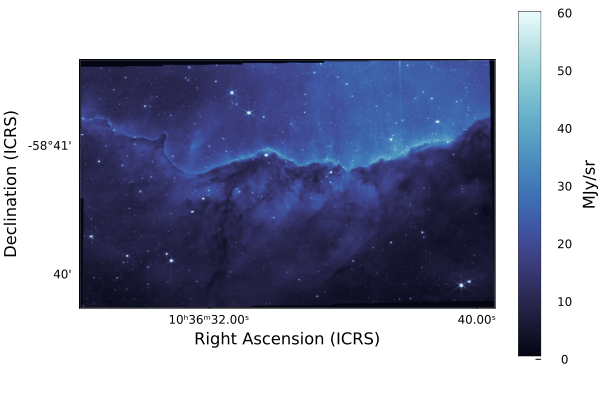

In [34]:
implot(carina; grid = false, clims = Zscale() , cmap = :ice)

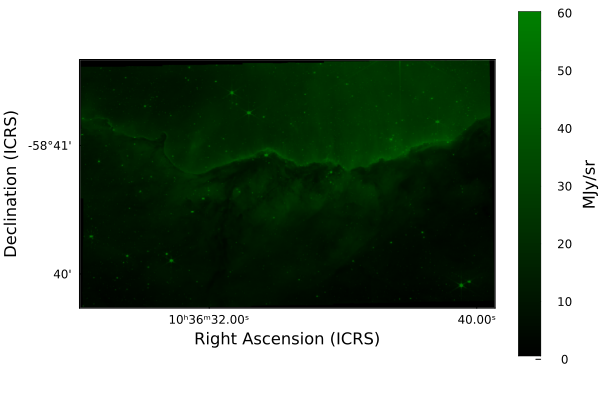

In [35]:
implot(carina; grid = false, clims = Zscale() , cmap = "green")

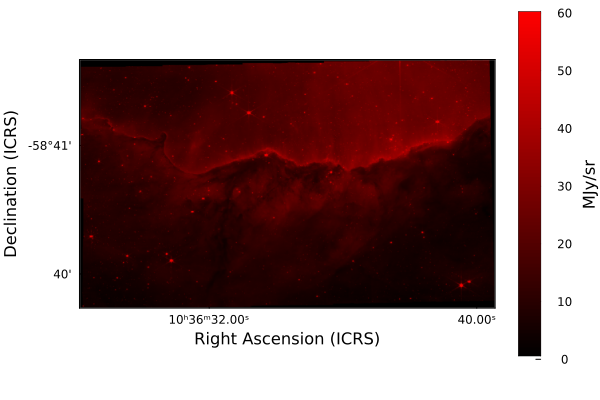

In [36]:
implot(carina; grid = false, clims = Zscale() , cmap = "red")

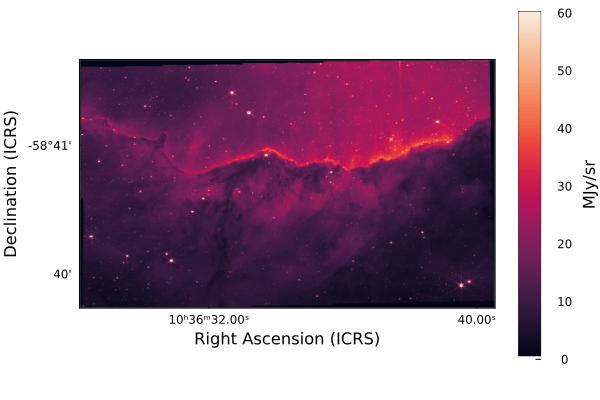

In [37]:
implot(carina; grid = false, clims = Zscale() , cmap = :seaborn_rocket_gradient)

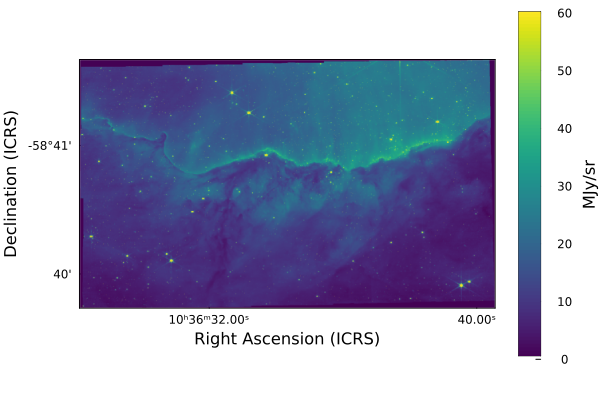

In [38]:
implot(carina; grid = false, clims = Zscale() , cmap = :viridis)

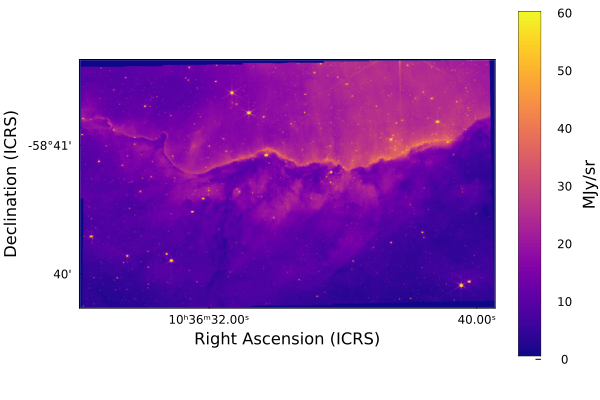

In [39]:
implot(carina; grid = false, clims = Zscale() , cmap = :plasma)

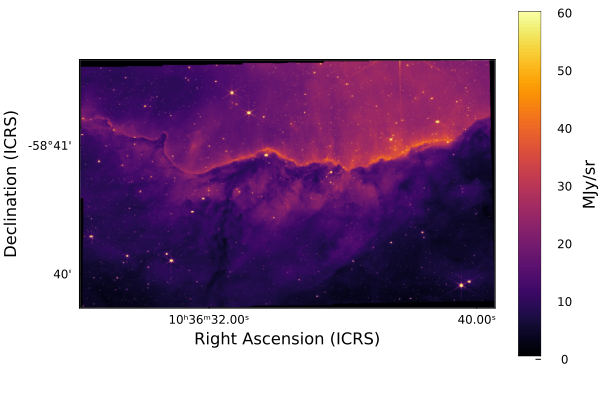

In [40]:
implot(carina; grid = false, clims = Zscale() , cmap = :inferno)

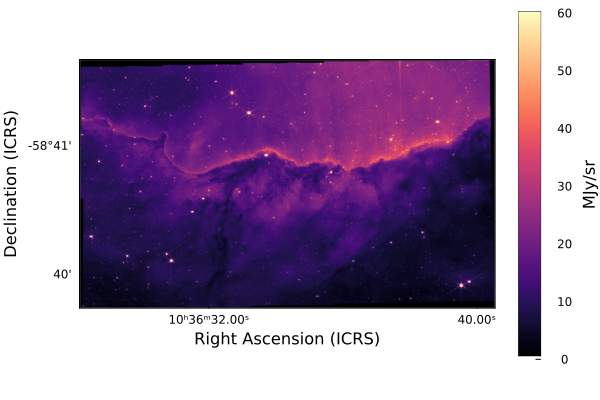

In [41]:
implot(carina; grid = false, clims = Zscale() , cmap = :magma)

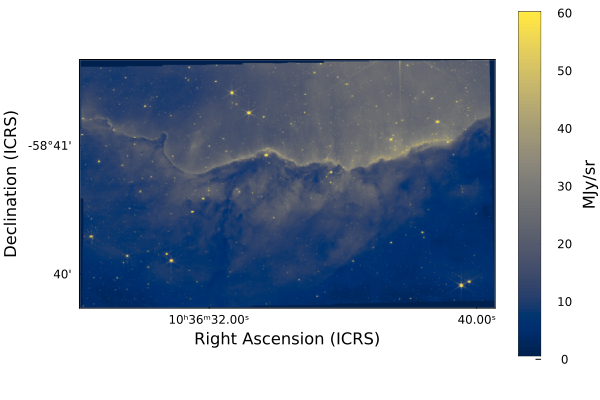

In [42]:
implot(carina; grid = false, clims = Zscale() , cmap = :cividis)

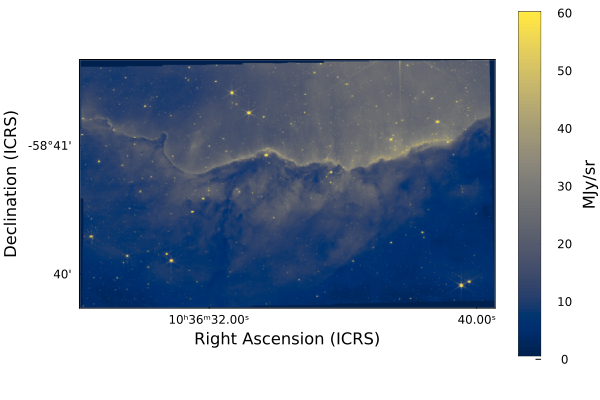

In [43]:
implot(carina; grid = false, clims = Zscale() , cmap = :cividis)

### Adding a Scalebar

Another way we can communicate the scale of this image is by adding a scalebar. Since we are working in spherical coordinates, the cartesian Pythagorean theorem won't quite cut it. There are approximations we can use for small angles, but let's go ahead and compute the scale bar length in a fully general way.

For two points of right-ascension $\alpha$ and declination $\delta$, $a = (\alpha_a , \delta_a)$ and $b = (\alpha_b, \delta_b)$,  

the angular seperation is 

$cos(\gamma) = cos(90^{\circ} - \delta_a)cos(90^{\circ} - \delta_b) + sin(90^{\circ} - \delta_a)sin(90^{\circ} - \delta_b)cos(\alpha_a - \alpha_b)$

We can calculate the length of our scalebar in pixels by picking a coordinate $a$, picking an angular seperation $\gamma$, and then solving for $b$:

In [45]:
using LinearAlgebra

# Start the scalebar here in pixel coordinates
a_px = [1000, 100]

# Convert to world coordinates
a_deg = pix_to_world(carina_full, a_px)

# Extend by 10 arcminutes of declination
b_deg  = a_deg .+ [0, 1/60]

# Convert back to pixel coordinates
b_px = world_to_pix(carina_full, b_deg)

# Measure the angular distance in pixel coordinates
# note: in theory this depends on where in the image we make this calculation
# because the coordinate system is warped
arcmin_px = norm(stop_coord_pix .- start_coord_pix)

# Plot our image again
implot(carina; grid=false, clims=Percent(98))

# Overplot the scalebar
plot!(
    # X
    [11000, 11000+arcmin_px],
    # Y
    [1000,  1000];
    # Formatting:
    color=:white,
    linewidth=5,
    label=""
)

# add annotation
annx = 11000+arcmin_px/2
anny = 1000+100
annotate!(
    (annx, anny, text(" 1' ", 10, :white, :center, :bottom))
)

LoadError: UndefVarError: stop_coord_pix not defined

Looking good! If we only want to communiate the scale and not the location, we can hide the tick marks and colorbar for a cleaner look:

In [47]:
# Hide decorations
implot(
    carina[10:end-10, 10:end-10]; # crop slightly
    grid=false,
    ticks=false,
    colorbar=false,
    clims=Percent(98),
    xlabel="",
    ylabel="",
    framestyle=:none,
    background_outside=:transparent,
)

# Overplot the scalebar
plot!(
    # X
    [11000, 11000+arcmin_px],
    # Y
    [1000,  1000];
    # Formatting:
    color=:white,
    linewidth=5,
    label="",
)

# add annotation
annx = 11000+arcmin_px/2
anny = 1000+100
annotate!(
    (annx, anny, text(" 1' ", 10, :white, :center, :bottom)) 
)

┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\jeffr\.julia\packages\PlotUtils\igbcf\src\ticks.jl:191


LoadError: UndefVarError: arcmin_px not defined

To save the image, just run savefig("output.png"). pdf, svg, and other file formats are also supported.

To learn more about displaying images and world coordinates, see the AstroImages.jl documentation.

For more on plotting in general, see the Plots.jl documentation.

## MAST 데이터 다운로드 방법